
![alttext](../imgs/face_tiling.png)

# DeepSIM Colab #

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/levifussell/DeepSIM/blob/master/notebooks/DeepSIM_Run.ipynb)

This notebook walks you through training DeepSIM on a custom dataset of my face. All credit of the source code goes to the original paper authors [here](https://github.com/eliahuhorwitz/DeepSIM). I just made some additions so the code was compatible with colab.

## Setup ##

In [1]:
#@title Setup

#@markdown Run this cell to download the code
#@markdown and build the training environment.

#@markdown After running it once, you'll need
#@markdown to restart the environment and run
#@markdown it a second time.

repull_repo = False

from IPython.utils import io
with io.capture_output() as captured:
  if repull_repo:
    %cd /content/
    %rm -rf DeepSIM || cd /content
    !git clone https://github.com/levifussell/DeepSIM
  %cd /content/DeepSIM
# !perl -pi -e 's/torch==1\.8\.0//g' requirements.txt

# !perl -pi -e 's/torch==1\.8\.0/torch==1\.8\.0+cu111/g' requirements.txt
# !sed '22a\ --find-links https://download.pytorch.org/whl/torch_stable.html' requirements.txt

!pip install torch==1.8.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html
!pip install -r requirements.txt
!pip install imageio-ffmpeg


/content/DeepSIM
Looking in links: https://download.pytorch.org/whl/torch_stable.html


## Building your own dataset ## 

**If you already have a dataset, you can safely ignore this section.**

Here is a ffmpeg code snippet that will extract 'N' frames from your video. You can look through these frames to find the ones that would be best to animate over the top. Once you find a good image that is representative, include it in your own dataset directory as described below.

In [37]:
#@title Building a dataset

%%capture

input_video_filename  = "datasets/face2/final_video.mp4"  #@param{type:"string"}
video_length_secs     = 27                                #@param{type:"integer"} 
sample_fps            = 1                                 #@param{type:"integer"}

import os
tmp_sample_dir = os.path.join('/content', 'DeepSIM', 'datasets', 'temp_samples')
os.makedirs(tmp_sample_dir, exist_ok=True)
tmp_frame_name = os.path.join(tmp_sample_dir, 'sample_frame%d.png')
range_info = f'between(t,{0},{video_length_secs})'
!ffmpeg -i '{input_video_filename}' -vf "fps='{sample_fps}',select='{range_info}'" -vsync 0 '{tmp_frame_name}' 

## Training ##

In [53]:
#@title Train Settings

#@markdown Enter the name of the directory where the
#@markdown data you want to use is. The directory should
#@markdown contain one folder for the real image(s),
#@markdown named "train_B", one folder for the,
#@markdown segmented image(s), named "train_seg", and
#@markdown one folder for the test image(s), name "test_seg".
#@markdown For example, here's what a dataset of an animation of your face
#@markdown might look like: <br><br>
#@markdown datasets/my_face/ <br>
#@markdown &ensp;|--- train_B/ <br>
#@markdown &ensp;|&emsp;|--- my_face_animation1.png <br>
#@markdown &ensp;|--- train_seg/ <br>
#@markdown &ensp;|&emsp;|--- my_face_photo1.png <br>
#@markdown &ensp;|--- test_seg/ <br>
#@markdown &ensp;|&emsp;|--- my_face_photo2.png <br>

data_directory  = "/content/drive/MyDrive/me2"  #@param{type:"string"}

#@markdown Give a name to tag the model and data with:

output_name     = "DeepSIMme2"    #@param{type:"string"}

#@markdown Start model from last saved checkpoint:

continue_train  = False             #@param{type:"boolean"}

#@markdown Saving models to the mounted drive will avoid
#@markdown accidentally losing your progress if the runtime
#@markdown terminates:

save_to_drive   = True              #@param{type:"boolean"}

if save_to_drive:
  from google.colab import drive
  drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Train Data Output:


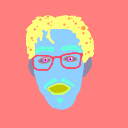

Train Data Input:


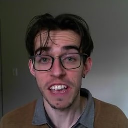

In [54]:
#@title Dataset Visualization

#@markdown Running this cell shows us
#@markdown what image we are going to
#@markdown be training on just to make
#@markdown sure.

from PIL import Image
from IPython.display import display
import os
import glob

print("Train Data Output:")
for f in glob.glob(os.path.join(data_directory, 'train_B/*.png')):
  trainIm = Image.open(f)
  display(trainIm)
print("Train Data Input:")
for f in glob.glob(os.path.join(data_directory, 'train_seg/*.png')):
  trainSeg = Image.open(f)
  display(trainSeg)

name DeepSIMme2
GPU IDs [0]
CustomDatasetDataLoader
dataset [AlignedDataset] was created
#training images = 1
create web directory ./checkpoints/DeepSIMme2/web...
display_delta 0
print_delta 0.0
save_delta 0


  1%|          | 200/16001 [01:24<1:51:46,  2.36it/s]

(epoch: 200, iters: 4, time: 0.106) G_GAN: 0.801 G_GAN_Feat: 3.536 G_VGG: 4.872 D_real: 0.411 D_fake: 0.442 
input_label


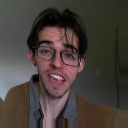

synthesized_image


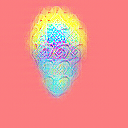

real_image


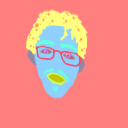

saving the latest model (epoch 200, total_steps 800)


  2%|▏         | 400/16001 [02:58<1:53:09,  2.30it/s]

(epoch: 400, iters: 4, time: 0.110) G_GAN: 0.570 G_GAN_Feat: 2.833 G_VGG: 4.423 D_real: 0.325 D_fake: 0.691 
input_label


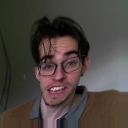

synthesized_image


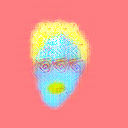

real_image


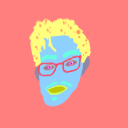

saving the latest model (epoch 400, total_steps 1600)


  4%|▎         | 600/16001 [04:33<1:53:35,  2.26it/s]

(epoch: 600, iters: 4, time: 0.111) G_GAN: 1.142 G_GAN_Feat: 2.801 G_VGG: 3.599 D_real: 0.667 D_fake: 0.225 
input_label


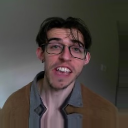

synthesized_image


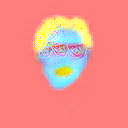

real_image


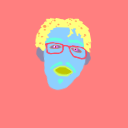

saving the latest model (epoch 600, total_steps 2400)


  5%|▍         | 800/16001 [06:09<1:51:49,  2.27it/s]

(epoch: 800, iters: 4, time: 0.111) G_GAN: 0.941 G_GAN_Feat: 2.938 G_VGG: 3.847 D_real: 0.314 D_fake: 0.294 
input_label


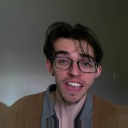

synthesized_image


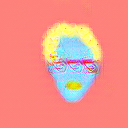

real_image


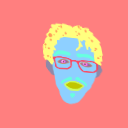

saving the latest model (epoch 800, total_steps 3200)


  6%|▌         | 1000/16001 [07:45<1:52:17,  2.23it/s]

(epoch: 1000, iters: 4, time: 0.112) G_GAN: 0.615 G_GAN_Feat: 3.012 G_VGG: 3.720 D_real: 0.242 D_fake: 0.623 
input_label


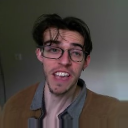

synthesized_image


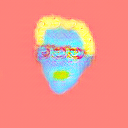

real_image


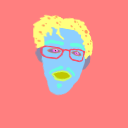

saving the latest model (epoch 1000, total_steps 4000)


  7%|▋         | 1200/16001 [09:21<1:49:19,  2.26it/s]

(epoch: 1200, iters: 4, time: 0.113) G_GAN: 0.480 G_GAN_Feat: 3.245 G_VGG: 4.113 D_real: 0.148 D_fake: 0.854 
input_label


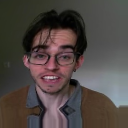

synthesized_image


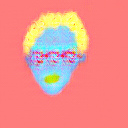

real_image


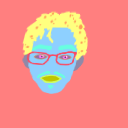

saving the latest model (epoch 1200, total_steps 4800)


  9%|▊         | 1400/16001 [11:00<1:51:10,  2.19it/s]

(epoch: 1400, iters: 4, time: 0.115) G_GAN: 0.952 G_GAN_Feat: 2.760 G_VGG: 3.356 D_real: 0.330 D_fake: 0.248 
input_label


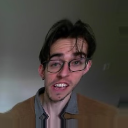

synthesized_image


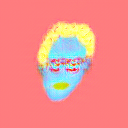

real_image


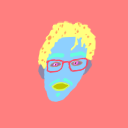

saving the latest model (epoch 1400, total_steps 5600)


 10%|▉         | 1600/16001 [12:39<1:51:04,  2.16it/s]

(epoch: 1600, iters: 4, time: 0.116) G_GAN: 2.192 G_GAN_Feat: 3.410 G_VGG: 3.501 D_real: 0.422 D_fake: 0.104 
input_label


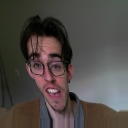

synthesized_image


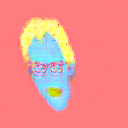

real_image


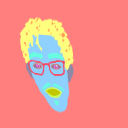

saving the latest model (epoch 1600, total_steps 6400)


 11%|█         | 1800/16001 [14:19<1:49:57,  2.15it/s]

(epoch: 1800, iters: 4, time: 0.117) G_GAN: 2.310 G_GAN_Feat: 3.331 G_VGG: 3.372 D_real: 0.477 D_fake: 0.052 
input_label


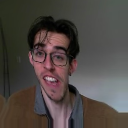

synthesized_image


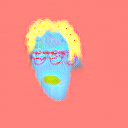

real_image


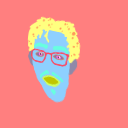

saving the latest model (epoch 1800, total_steps 7200)


 12%|█▏        | 2000/16001 [16:01<1:52:05,  2.08it/s]

(epoch: 2000, iters: 4, time: 0.119) G_GAN: 1.421 G_GAN_Feat: 2.951 G_VGG: 3.287 D_real: 0.207 D_fake: 0.187 
input_label


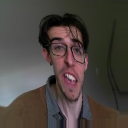

synthesized_image


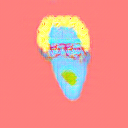

real_image


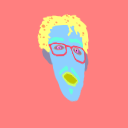

saving the latest model (epoch 2000, total_steps 8000)


 14%|█▎        | 2200/16001 [17:43<1:48:05,  2.13it/s]

(epoch: 2200, iters: 4, time: 0.119) G_GAN: 1.618 G_GAN_Feat: 3.101 G_VGG: 3.473 D_real: 0.435 D_fake: 0.061 
input_label


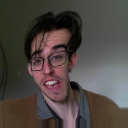

synthesized_image


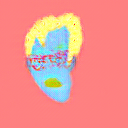

real_image


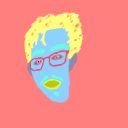

saving the latest model (epoch 2200, total_steps 8800)


 15%|█▍        | 2399/16001 [19:26<1:48:41,  2.09it/s]

In [ ]:
#@title Train Model

#@markdown **IMPORTANT: if you are wanting to continue training from an old state, make sure to enable _'continue_train'_ in training_settings.**


#@markdown If you're happy with your settings above, all
#@markdown need to do is just run this cell now.

import train

notebook_args = {
    'name'                : output_name,
    'dataroot'            : data_directory,
    'primitive'           : 'seg',
    'no_instance'         : True,
    'tps_aug'             : 1,
    'gpu_ids'             : '0',
    'display_freq'        : 200,
    'save_latest_freq'    : 200,
    'print_freq'          : 200,
    'save_epoch_freq'     : 1000000,
    'batchSize'           : 4,
    'save_to_drive'       : save_to_drive,
    'continue_train'      : continue_train,

    # FIXED.
    'is_notebook' : True,
}

notebook_args['display_freq'] *= notebook_args['batchSize']
notebook_args['save_latest_freq'] *= notebook_args['batchSize']
notebook_args['save_epoch_freq'] *= notebook_args['batchSize']
notebook_args['print_freq'] *= notebook_args['batchSize']

train.run(notebook_args)

## Testing ##

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

/content/DeepSIM/models/pix2pixHD_model.py:136: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  input_label = Variable(input_label, volatile=infer)


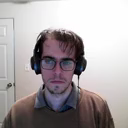

generated


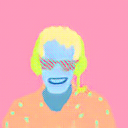

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame10.png']
process image... ['datasets/face2/test_seg/frame10.png']
label


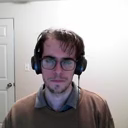

generated


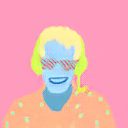

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame100.png']
process image... ['datasets/face2/test_seg/frame100.png']
label


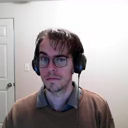

generated


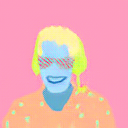

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame101.png']
process image... ['datasets/face2/test_seg/frame101.png']
label


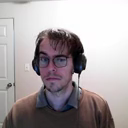

generated


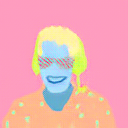

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame102.png']
process image... ['datasets/face2/test_seg/frame102.png']
label


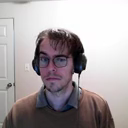

generated


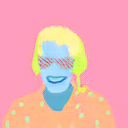

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame103.png']
process image... ['datasets/face2/test_seg/frame103.png']
label


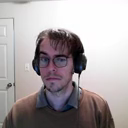

generated


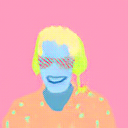

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame104.png']
process image... ['datasets/face2/test_seg/frame104.png']
label


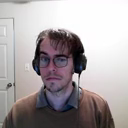

generated


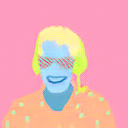

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame105.png']
process image... ['datasets/face2/test_seg/frame105.png']
label


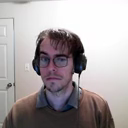

generated


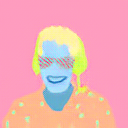

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame106.png']
process image... ['datasets/face2/test_seg/frame106.png']
label


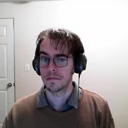

generated


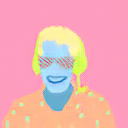

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame107.png']
process image... ['datasets/face2/test_seg/frame107.png']
label


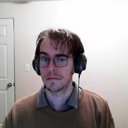

generated


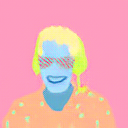

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame108.png']
process image... ['datasets/face2/test_seg/frame108.png']
label


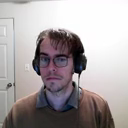

generated


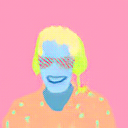

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame109.png']
process image... ['datasets/face2/test_seg/frame109.png']
label


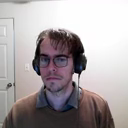

generated


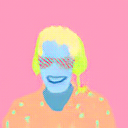

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame11.png']
process image... ['datasets/face2/test_seg/frame11.png']
label


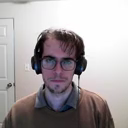

generated


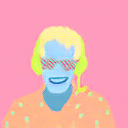

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame110.png']
process image... ['datasets/face2/test_seg/frame110.png']
label


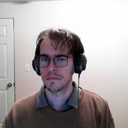

generated


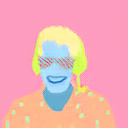

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame111.png']
process image... ['datasets/face2/test_seg/frame111.png']
label


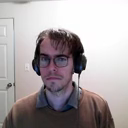

generated


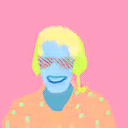

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame112.png']
process image... ['datasets/face2/test_seg/frame112.png']
label


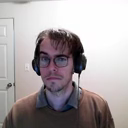

generated


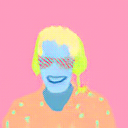

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame113.png']
process image... ['datasets/face2/test_seg/frame113.png']
label


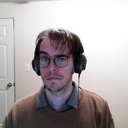

generated


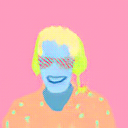

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame114.png']
process image... ['datasets/face2/test_seg/frame114.png']
label


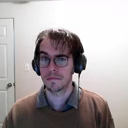

generated


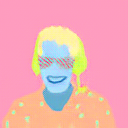

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame115.png']
process image... ['datasets/face2/test_seg/frame115.png']
label


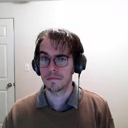

generated


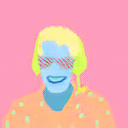

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame116.png']
process image... ['datasets/face2/test_seg/frame116.png']
label


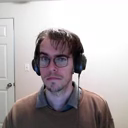

generated


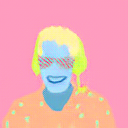

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame117.png']
process image... ['datasets/face2/test_seg/frame117.png']
label


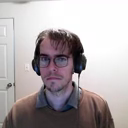

generated


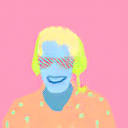

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame118.png']
process image... ['datasets/face2/test_seg/frame118.png']
label


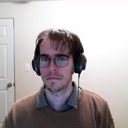

generated


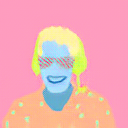

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame119.png']
process image... ['datasets/face2/test_seg/frame119.png']
label


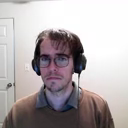

generated


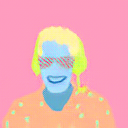

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame12.png']
process image... ['datasets/face2/test_seg/frame12.png']
label


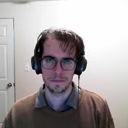

generated


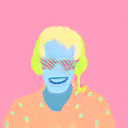

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame120.png']
process image... ['datasets/face2/test_seg/frame120.png']
label


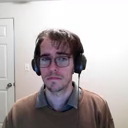

generated


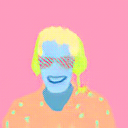

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame121.png']
process image... ['datasets/face2/test_seg/frame121.png']
label


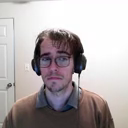

generated


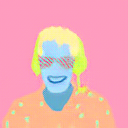

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame122.png']
process image... ['datasets/face2/test_seg/frame122.png']
label


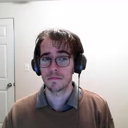

generated


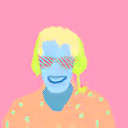

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame123.png']
process image... ['datasets/face2/test_seg/frame123.png']
label


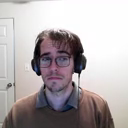

generated


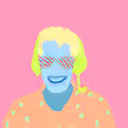

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame124.png']
process image... ['datasets/face2/test_seg/frame124.png']
label


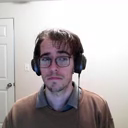

generated


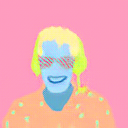

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame125.png']
process image... ['datasets/face2/test_seg/frame125.png']
label


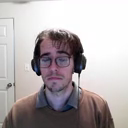

generated


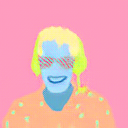

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame126.png']
process image... ['datasets/face2/test_seg/frame126.png']
label


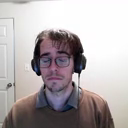

generated


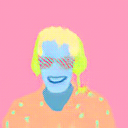

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame127.png']
process image... ['datasets/face2/test_seg/frame127.png']
label


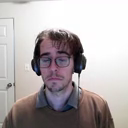

generated


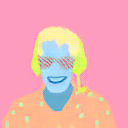

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame128.png']
process image... ['datasets/face2/test_seg/frame128.png']
label


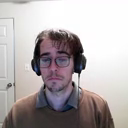

generated


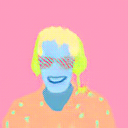

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame129.png']
process image... ['datasets/face2/test_seg/frame129.png']
label


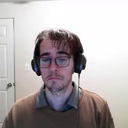

generated


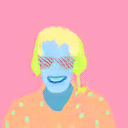

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame13.png']
process image... ['datasets/face2/test_seg/frame13.png']
label


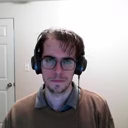

generated


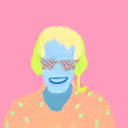

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame130.png']
process image... ['datasets/face2/test_seg/frame130.png']
label


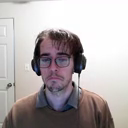

generated


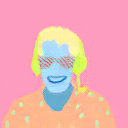

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame131.png']
process image... ['datasets/face2/test_seg/frame131.png']
label


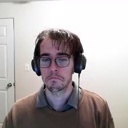

generated


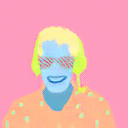

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame132.png']
process image... ['datasets/face2/test_seg/frame132.png']
label


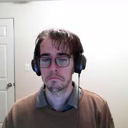

generated


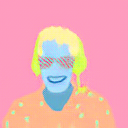

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame133.png']
process image... ['datasets/face2/test_seg/frame133.png']
label


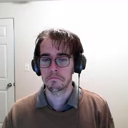

generated


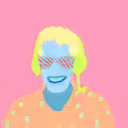

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame134.png']
process image... ['datasets/face2/test_seg/frame134.png']
label


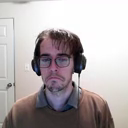

generated


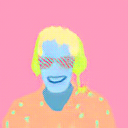

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame135.png']
process image... ['datasets/face2/test_seg/frame135.png']
label


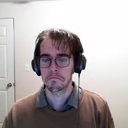

generated


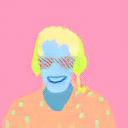

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame136.png']
process image... ['datasets/face2/test_seg/frame136.png']
label


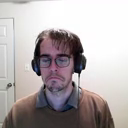

generated


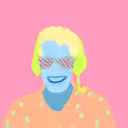

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame137.png']
process image... ['datasets/face2/test_seg/frame137.png']
label


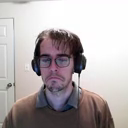

generated


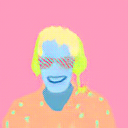

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame138.png']
process image... ['datasets/face2/test_seg/frame138.png']
label


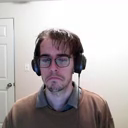

generated


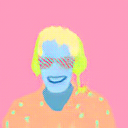

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame139.png']
process image... ['datasets/face2/test_seg/frame139.png']
label


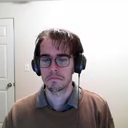

generated


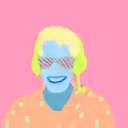

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame14.png']
process image... ['datasets/face2/test_seg/frame14.png']
label


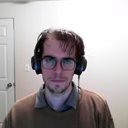

generated


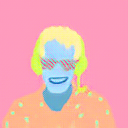

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame140.png']
process image... ['datasets/face2/test_seg/frame140.png']
label


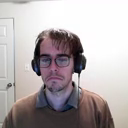

generated


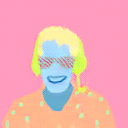

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame141.png']
process image... ['datasets/face2/test_seg/frame141.png']
label


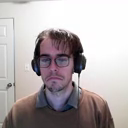

generated


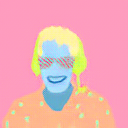

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame142.png']
process image... ['datasets/face2/test_seg/frame142.png']
label


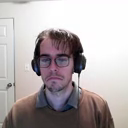

generated


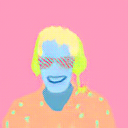

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame143.png']
process image... ['datasets/face2/test_seg/frame143.png']
label


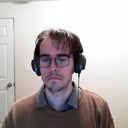

generated


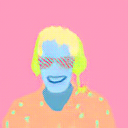

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame144.png']
process image... ['datasets/face2/test_seg/frame144.png']
label


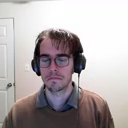

generated


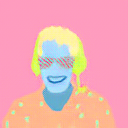

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame145.png']
process image... ['datasets/face2/test_seg/frame145.png']
label


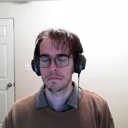

generated


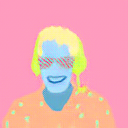

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame146.png']
process image... ['datasets/face2/test_seg/frame146.png']
label


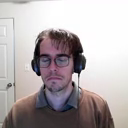

generated


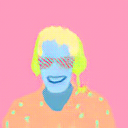

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame147.png']
process image... ['datasets/face2/test_seg/frame147.png']
label


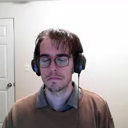

generated


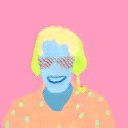

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame148.png']
process image... ['datasets/face2/test_seg/frame148.png']
label


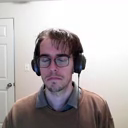

generated


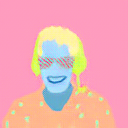

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame149.png']
process image... ['datasets/face2/test_seg/frame149.png']
label


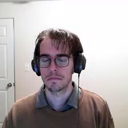

generated


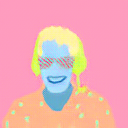

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame15.png']
process image... ['datasets/face2/test_seg/frame15.png']
label


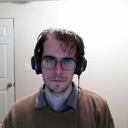

generated


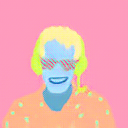

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame150.png']
process image... ['datasets/face2/test_seg/frame150.png']
label


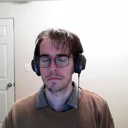

generated


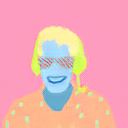

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame151.png']
process image... ['datasets/face2/test_seg/frame151.png']
label


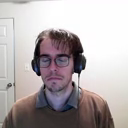

generated


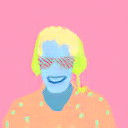

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame152.png']
process image... ['datasets/face2/test_seg/frame152.png']
label


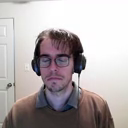

generated


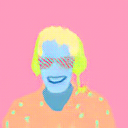

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame153.png']
process image... ['datasets/face2/test_seg/frame153.png']
label


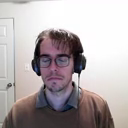

generated


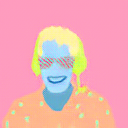

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame154.png']
process image... ['datasets/face2/test_seg/frame154.png']
label


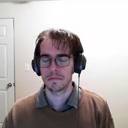

generated


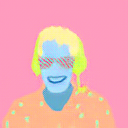

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame155.png']
process image... ['datasets/face2/test_seg/frame155.png']
label


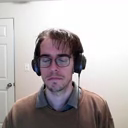

generated


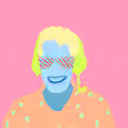

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame156.png']
process image... ['datasets/face2/test_seg/frame156.png']
label


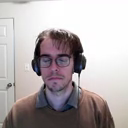

generated


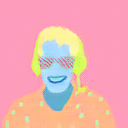

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame157.png']
process image... ['datasets/face2/test_seg/frame157.png']
label


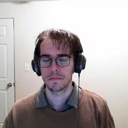

generated


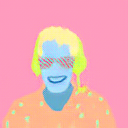

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame158.png']
process image... ['datasets/face2/test_seg/frame158.png']
label


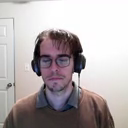

generated


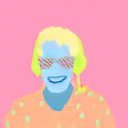

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame159.png']
process image... ['datasets/face2/test_seg/frame159.png']
label


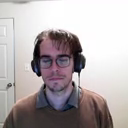

generated


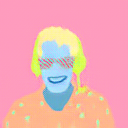

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame16.png']
process image... ['datasets/face2/test_seg/frame16.png']
label


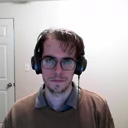

generated


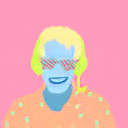

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame160.png']
process image... ['datasets/face2/test_seg/frame160.png']
label


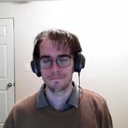

generated


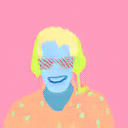

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame161.png']
process image... ['datasets/face2/test_seg/frame161.png']
label


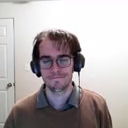

generated


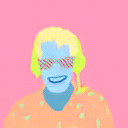

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame162.png']
process image... ['datasets/face2/test_seg/frame162.png']
label


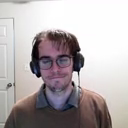

generated


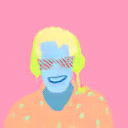

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame163.png']
process image... ['datasets/face2/test_seg/frame163.png']
label


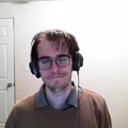

generated


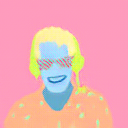

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame164.png']
process image... ['datasets/face2/test_seg/frame164.png']
label


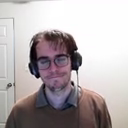

generated


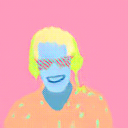

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame165.png']
process image... ['datasets/face2/test_seg/frame165.png']
label


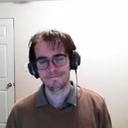

generated


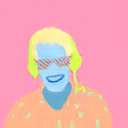

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame166.png']
process image... ['datasets/face2/test_seg/frame166.png']
label


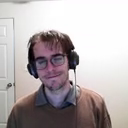

generated


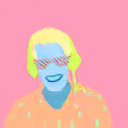

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame167.png']
process image... ['datasets/face2/test_seg/frame167.png']
label


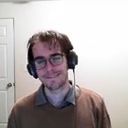

generated


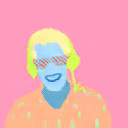

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame168.png']
process image... ['datasets/face2/test_seg/frame168.png']
label


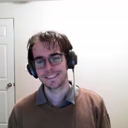

generated


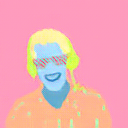

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame169.png']
process image... ['datasets/face2/test_seg/frame169.png']
label


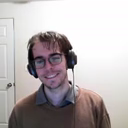

generated


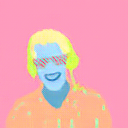

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame17.png']
process image... ['datasets/face2/test_seg/frame17.png']
label


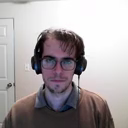

generated


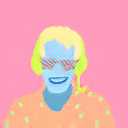

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame170.png']
process image... ['datasets/face2/test_seg/frame170.png']
label


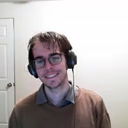

generated


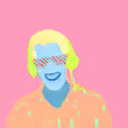

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame171.png']
process image... ['datasets/face2/test_seg/frame171.png']
label


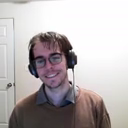

generated


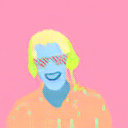

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame172.png']
process image... ['datasets/face2/test_seg/frame172.png']
label


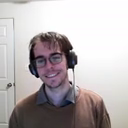

generated


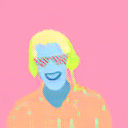

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame173.png']
process image... ['datasets/face2/test_seg/frame173.png']
label


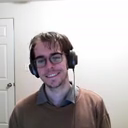

generated


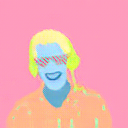

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame174.png']
process image... ['datasets/face2/test_seg/frame174.png']
label


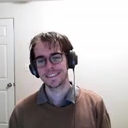

generated


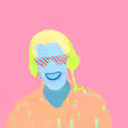

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame175.png']
process image... ['datasets/face2/test_seg/frame175.png']
label


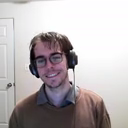

generated


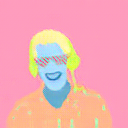

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame176.png']
process image... ['datasets/face2/test_seg/frame176.png']
label


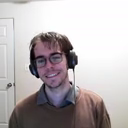

generated


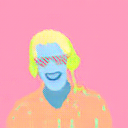

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame177.png']
process image... ['datasets/face2/test_seg/frame177.png']
label


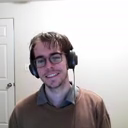

generated


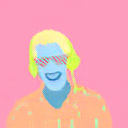

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame178.png']
process image... ['datasets/face2/test_seg/frame178.png']
label


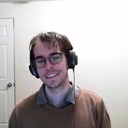

generated


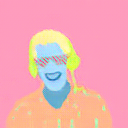

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame179.png']
process image... ['datasets/face2/test_seg/frame179.png']
label


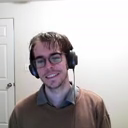

generated


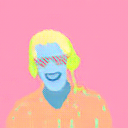

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame18.png']
process image... ['datasets/face2/test_seg/frame18.png']
label


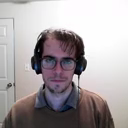

generated


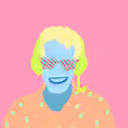

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame180.png']
process image... ['datasets/face2/test_seg/frame180.png']
label


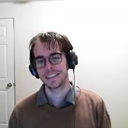

generated


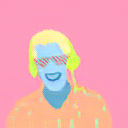

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame181.png']
process image... ['datasets/face2/test_seg/frame181.png']
label


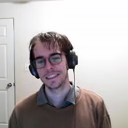

generated


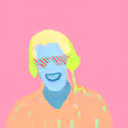

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame182.png']
process image... ['datasets/face2/test_seg/frame182.png']
label


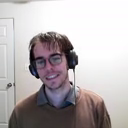

generated


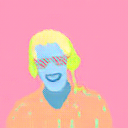

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame183.png']
process image... ['datasets/face2/test_seg/frame183.png']
label


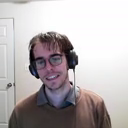

generated


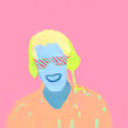

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame184.png']
process image... ['datasets/face2/test_seg/frame184.png']
label


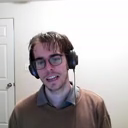

generated


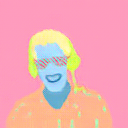

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame185.png']
process image... ['datasets/face2/test_seg/frame185.png']
label


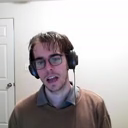

generated


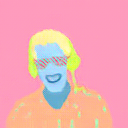

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame186.png']
process image... ['datasets/face2/test_seg/frame186.png']
label


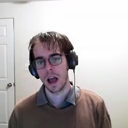

generated


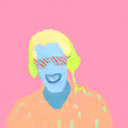

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame187.png']
process image... ['datasets/face2/test_seg/frame187.png']
label


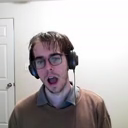

generated


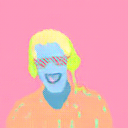

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame188.png']
process image... ['datasets/face2/test_seg/frame188.png']
label


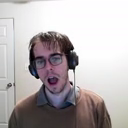

generated


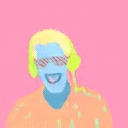

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame189.png']
process image... ['datasets/face2/test_seg/frame189.png']
label


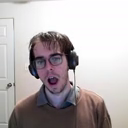

generated


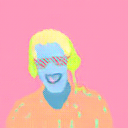

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame19.png']
process image... ['datasets/face2/test_seg/frame19.png']
label


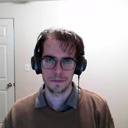

generated


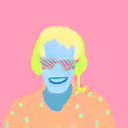

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame190.png']
process image... ['datasets/face2/test_seg/frame190.png']
label


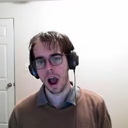

generated


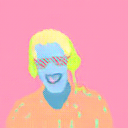

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame191.png']
process image... ['datasets/face2/test_seg/frame191.png']
label


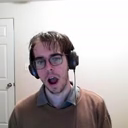

generated


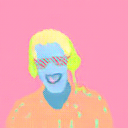

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame192.png']
process image... ['datasets/face2/test_seg/frame192.png']
label


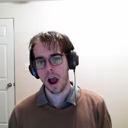

generated


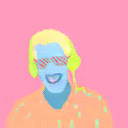

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame193.png']
process image... ['datasets/face2/test_seg/frame193.png']
label


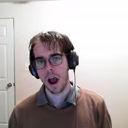

generated


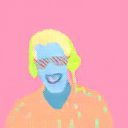

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame194.png']
process image... ['datasets/face2/test_seg/frame194.png']
label


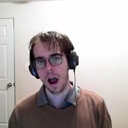

generated


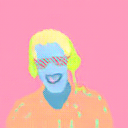

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame195.png']
process image... ['datasets/face2/test_seg/frame195.png']
label


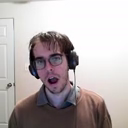

generated


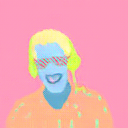

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame196.png']
process image... ['datasets/face2/test_seg/frame196.png']
label


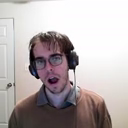

generated


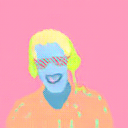

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame197.png']
process image... ['datasets/face2/test_seg/frame197.png']
label


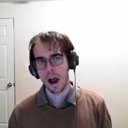

generated


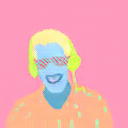

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame198.png']
process image... ['datasets/face2/test_seg/frame198.png']
label


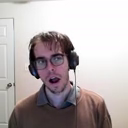

generated


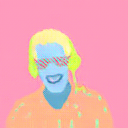

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame199.png']
process image... ['datasets/face2/test_seg/frame199.png']
label


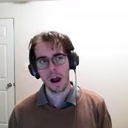

generated


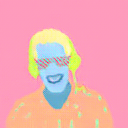

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame2.png']
process image... ['datasets/face2/test_seg/frame2.png']
label


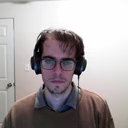

generated


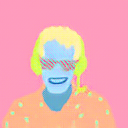

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame20.png']
process image... ['datasets/face2/test_seg/frame20.png']
label


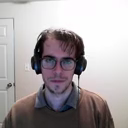

generated


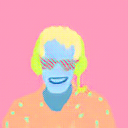

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame200.png']
process image... ['datasets/face2/test_seg/frame200.png']
label


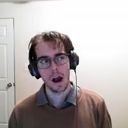

generated


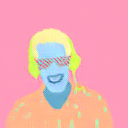

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame201.png']
process image... ['datasets/face2/test_seg/frame201.png']
label


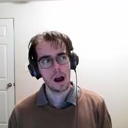

generated


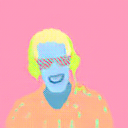

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame202.png']
process image... ['datasets/face2/test_seg/frame202.png']
label


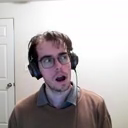

generated


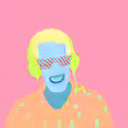

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame203.png']
process image... ['datasets/face2/test_seg/frame203.png']
label


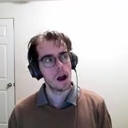

generated


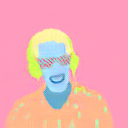

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame204.png']
process image... ['datasets/face2/test_seg/frame204.png']
label


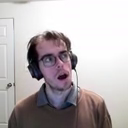

generated


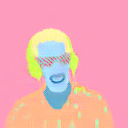

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame205.png']
process image... ['datasets/face2/test_seg/frame205.png']
label


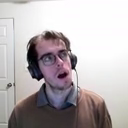

generated


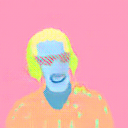

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame206.png']
process image... ['datasets/face2/test_seg/frame206.png']
label


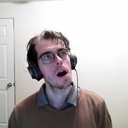

generated


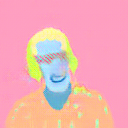

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame207.png']
process image... ['datasets/face2/test_seg/frame207.png']
label


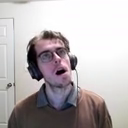

generated


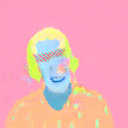

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame208.png']
process image... ['datasets/face2/test_seg/frame208.png']
label


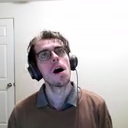

generated


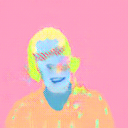

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame209.png']
process image... ['datasets/face2/test_seg/frame209.png']
label


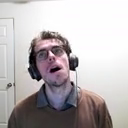

generated


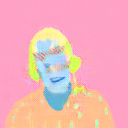

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame21.png']
process image... ['datasets/face2/test_seg/frame21.png']
label


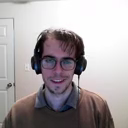

generated


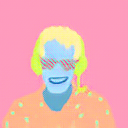

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame210.png']
process image... ['datasets/face2/test_seg/frame210.png']
label


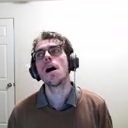

generated


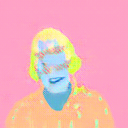

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame211.png']
process image... ['datasets/face2/test_seg/frame211.png']
label


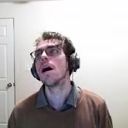

generated


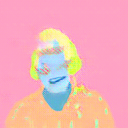

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame212.png']
process image... ['datasets/face2/test_seg/frame212.png']
label


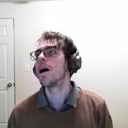

generated


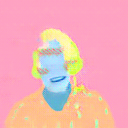

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame213.png']
process image... ['datasets/face2/test_seg/frame213.png']
label


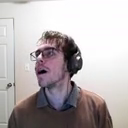

generated


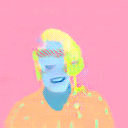

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame214.png']
process image... ['datasets/face2/test_seg/frame214.png']
label


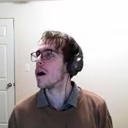

generated


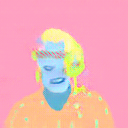

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame215.png']
process image... ['datasets/face2/test_seg/frame215.png']
label


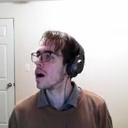

generated


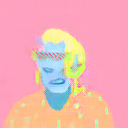

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame216.png']
process image... ['datasets/face2/test_seg/frame216.png']
label


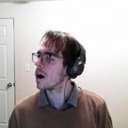

generated


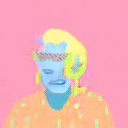

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame217.png']
process image... ['datasets/face2/test_seg/frame217.png']
label


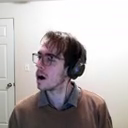

generated


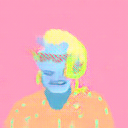

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame218.png']
process image... ['datasets/face2/test_seg/frame218.png']
label


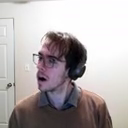

generated


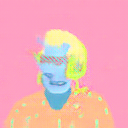

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame219.png']
process image... ['datasets/face2/test_seg/frame219.png']
label


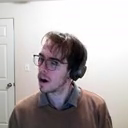

generated


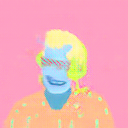

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame22.png']
process image... ['datasets/face2/test_seg/frame22.png']
label


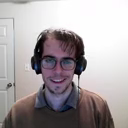

generated


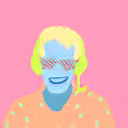

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame220.png']
process image... ['datasets/face2/test_seg/frame220.png']
label


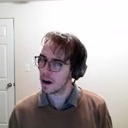

generated


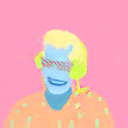

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame221.png']
process image... ['datasets/face2/test_seg/frame221.png']
label


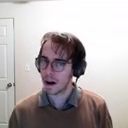

generated


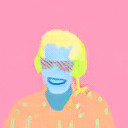

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame222.png']
process image... ['datasets/face2/test_seg/frame222.png']
label


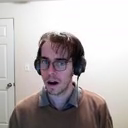

generated


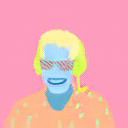

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame223.png']
process image... ['datasets/face2/test_seg/frame223.png']
label


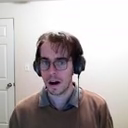

generated


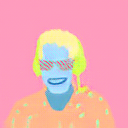

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame224.png']
process image... ['datasets/face2/test_seg/frame224.png']
label


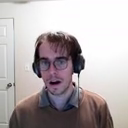

generated


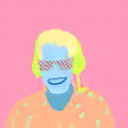

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame225.png']
process image... ['datasets/face2/test_seg/frame225.png']
label


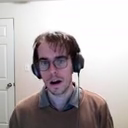

generated


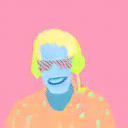

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame226.png']
process image... ['datasets/face2/test_seg/frame226.png']
label


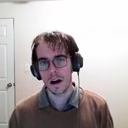

generated


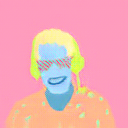

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame227.png']
process image... ['datasets/face2/test_seg/frame227.png']
label


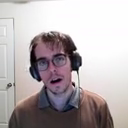

generated


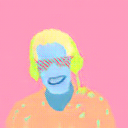

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame228.png']
process image... ['datasets/face2/test_seg/frame228.png']
label


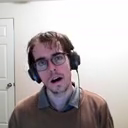

generated


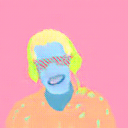

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame229.png']
process image... ['datasets/face2/test_seg/frame229.png']
label


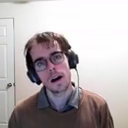

generated


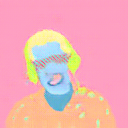

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame23.png']
process image... ['datasets/face2/test_seg/frame23.png']
label


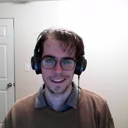

generated


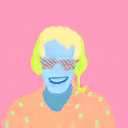

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame230.png']
process image... ['datasets/face2/test_seg/frame230.png']
label


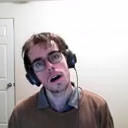

generated


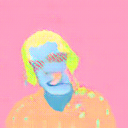

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame231.png']
process image... ['datasets/face2/test_seg/frame231.png']
label


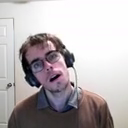

generated


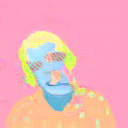

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame232.png']
process image... ['datasets/face2/test_seg/frame232.png']
label


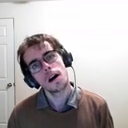

generated


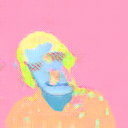

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame233.png']
process image... ['datasets/face2/test_seg/frame233.png']
label


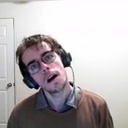

generated


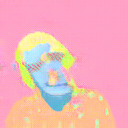

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame234.png']
process image... ['datasets/face2/test_seg/frame234.png']
label


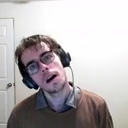

generated


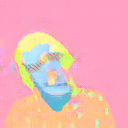

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame235.png']
process image... ['datasets/face2/test_seg/frame235.png']
label


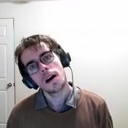

generated


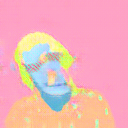

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame236.png']
process image... ['datasets/face2/test_seg/frame236.png']
label


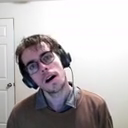

generated


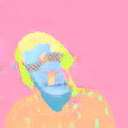

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame237.png']
process image... ['datasets/face2/test_seg/frame237.png']
label


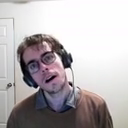

generated


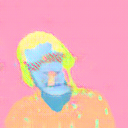

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame238.png']
process image... ['datasets/face2/test_seg/frame238.png']
label


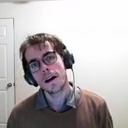

generated


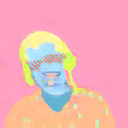

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame239.png']
process image... ['datasets/face2/test_seg/frame239.png']
label


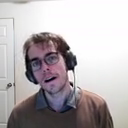

generated


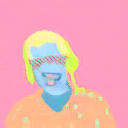

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame24.png']
process image... ['datasets/face2/test_seg/frame24.png']
label


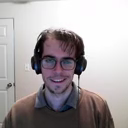

generated


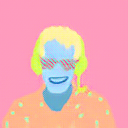

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame240.png']
process image... ['datasets/face2/test_seg/frame240.png']
label


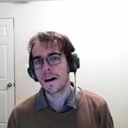

generated


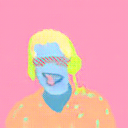

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame241.png']
process image... ['datasets/face2/test_seg/frame241.png']
label


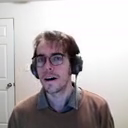

generated


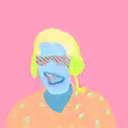

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame242.png']
process image... ['datasets/face2/test_seg/frame242.png']
label


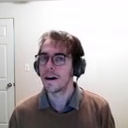

generated


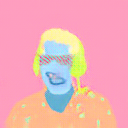

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame243.png']
process image... ['datasets/face2/test_seg/frame243.png']
label


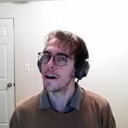

generated


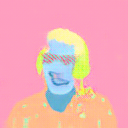

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame244.png']
process image... ['datasets/face2/test_seg/frame244.png']
label


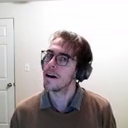

generated


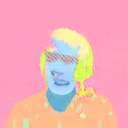

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame245.png']
process image... ['datasets/face2/test_seg/frame245.png']
label


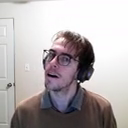

generated


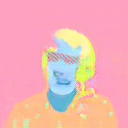

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame246.png']
process image... ['datasets/face2/test_seg/frame246.png']
label


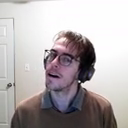

generated


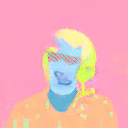

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame247.png']
process image... ['datasets/face2/test_seg/frame247.png']
label


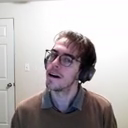

generated


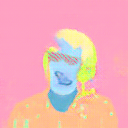

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame248.png']
process image... ['datasets/face2/test_seg/frame248.png']
label


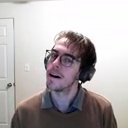

generated


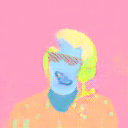

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame249.png']
process image... ['datasets/face2/test_seg/frame249.png']
label


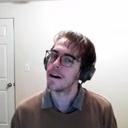

generated


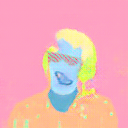

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame25.png']
process image... ['datasets/face2/test_seg/frame25.png']
label


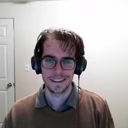

generated


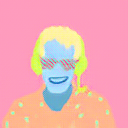

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame250.png']
process image... ['datasets/face2/test_seg/frame250.png']
label


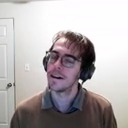

generated


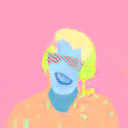

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame251.png']
process image... ['datasets/face2/test_seg/frame251.png']
label


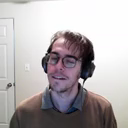

generated


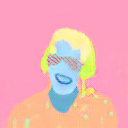

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame252.png']
process image... ['datasets/face2/test_seg/frame252.png']
label


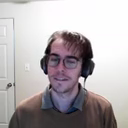

generated


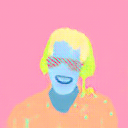

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame253.png']
process image... ['datasets/face2/test_seg/frame253.png']
label


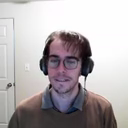

generated


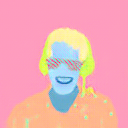

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame254.png']
process image... ['datasets/face2/test_seg/frame254.png']
label


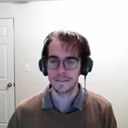

generated


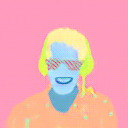

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame255.png']
process image... ['datasets/face2/test_seg/frame255.png']
label


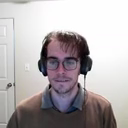

generated


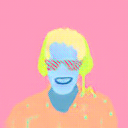

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame256.png']
process image... ['datasets/face2/test_seg/frame256.png']
label


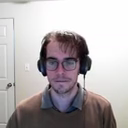

generated


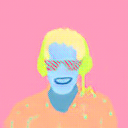

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame257.png']
process image... ['datasets/face2/test_seg/frame257.png']
label


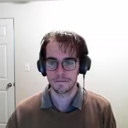

generated


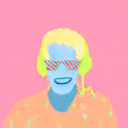

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame258.png']
process image... ['datasets/face2/test_seg/frame258.png']
label


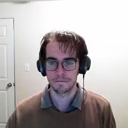

generated


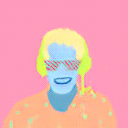

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame259.png']
process image... ['datasets/face2/test_seg/frame259.png']
label


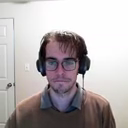

generated


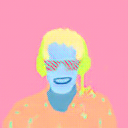

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame26.png']
process image... ['datasets/face2/test_seg/frame26.png']
label


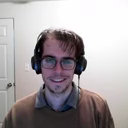

generated


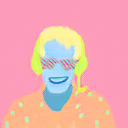

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame260.png']
process image... ['datasets/face2/test_seg/frame260.png']
label


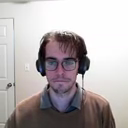

generated


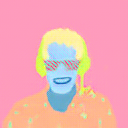

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame261.png']
process image... ['datasets/face2/test_seg/frame261.png']
label


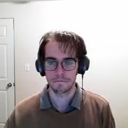

generated


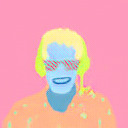

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame262.png']
process image... ['datasets/face2/test_seg/frame262.png']
label


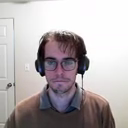

generated


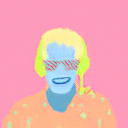

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame263.png']
process image... ['datasets/face2/test_seg/frame263.png']
label


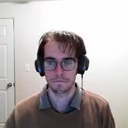

generated


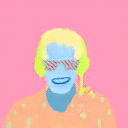

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame264.png']
process image... ['datasets/face2/test_seg/frame264.png']
label


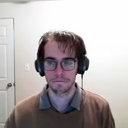

generated


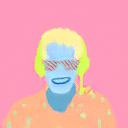

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame265.png']
process image... ['datasets/face2/test_seg/frame265.png']
label


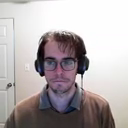

generated


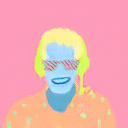

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame266.png']
process image... ['datasets/face2/test_seg/frame266.png']
label


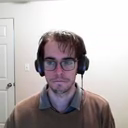

generated


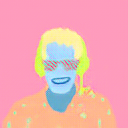

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame267.png']
process image... ['datasets/face2/test_seg/frame267.png']
label


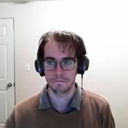

generated


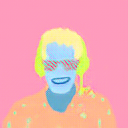

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame268.png']
process image... ['datasets/face2/test_seg/frame268.png']
label


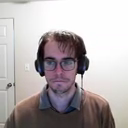

generated


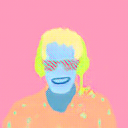

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame269.png']
process image... ['datasets/face2/test_seg/frame269.png']
label


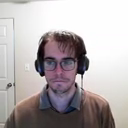

generated


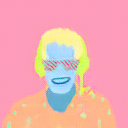

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame27.png']
process image... ['datasets/face2/test_seg/frame27.png']
label


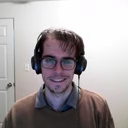

generated


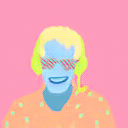

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame270.png']
process image... ['datasets/face2/test_seg/frame270.png']
label


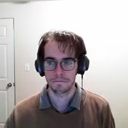

generated


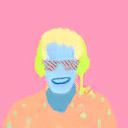

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame271.png']
process image... ['datasets/face2/test_seg/frame271.png']
label


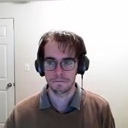

generated


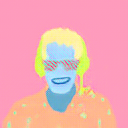

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame28.png']
process image... ['datasets/face2/test_seg/frame28.png']
label


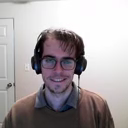

generated


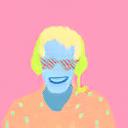

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame29.png']
process image... ['datasets/face2/test_seg/frame29.png']
label


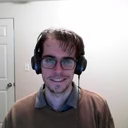

generated


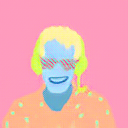

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame3.png']
process image... ['datasets/face2/test_seg/frame3.png']
label


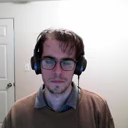

generated


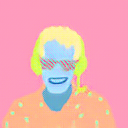

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame30.png']
process image... ['datasets/face2/test_seg/frame30.png']
label


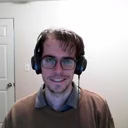

generated


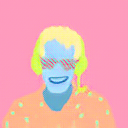

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame31.png']
process image... ['datasets/face2/test_seg/frame31.png']
label


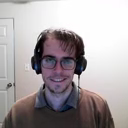

generated


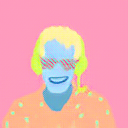

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame32.png']
process image... ['datasets/face2/test_seg/frame32.png']
label


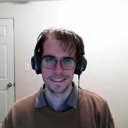

generated


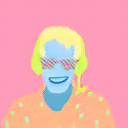

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame33.png']
process image... ['datasets/face2/test_seg/frame33.png']
label


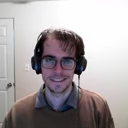

generated


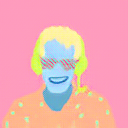

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame34.png']
process image... ['datasets/face2/test_seg/frame34.png']
label


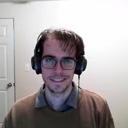

generated


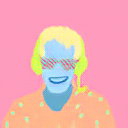

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame35.png']
process image... ['datasets/face2/test_seg/frame35.png']
label


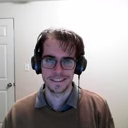

generated


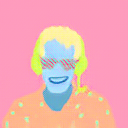

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame36.png']
process image... ['datasets/face2/test_seg/frame36.png']
label


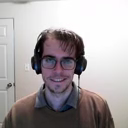

generated


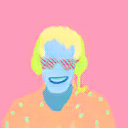

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame37.png']
process image... ['datasets/face2/test_seg/frame37.png']
label


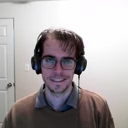

generated


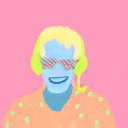

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame38.png']
process image... ['datasets/face2/test_seg/frame38.png']
label


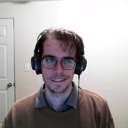

generated


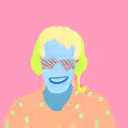

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame39.png']
process image... ['datasets/face2/test_seg/frame39.png']
label


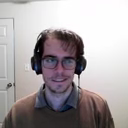

generated


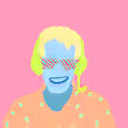

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame4.png']
process image... ['datasets/face2/test_seg/frame4.png']
label


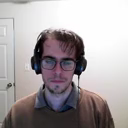

generated


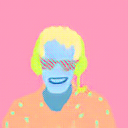

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame40.png']
process image... ['datasets/face2/test_seg/frame40.png']
label


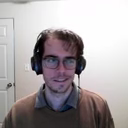

generated


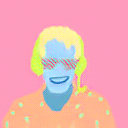

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame41.png']
process image... ['datasets/face2/test_seg/frame41.png']
label


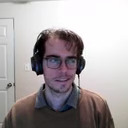

generated


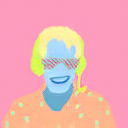

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame42.png']
process image... ['datasets/face2/test_seg/frame42.png']
label


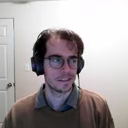

generated


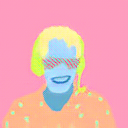

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame43.png']
process image... ['datasets/face2/test_seg/frame43.png']
label


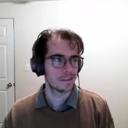

generated


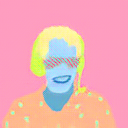

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame44.png']
process image... ['datasets/face2/test_seg/frame44.png']
label


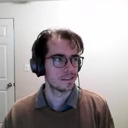

generated


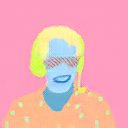

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame45.png']
process image... ['datasets/face2/test_seg/frame45.png']
label


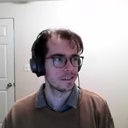

generated


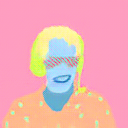

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame46.png']
process image... ['datasets/face2/test_seg/frame46.png']
label


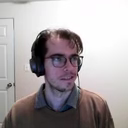

generated


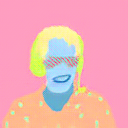

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame47.png']
process image... ['datasets/face2/test_seg/frame47.png']
label


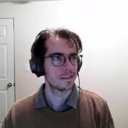

generated


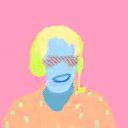

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame48.png']
process image... ['datasets/face2/test_seg/frame48.png']
label


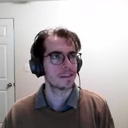

generated


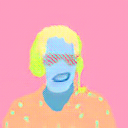

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame49.png']
process image... ['datasets/face2/test_seg/frame49.png']
label


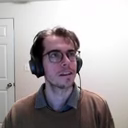

generated


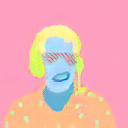

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame5.png']
process image... ['datasets/face2/test_seg/frame5.png']
label


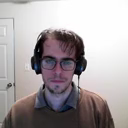

generated


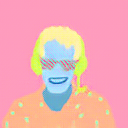

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame50.png']
process image... ['datasets/face2/test_seg/frame50.png']
label


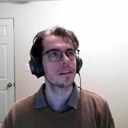

generated


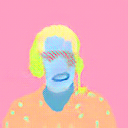

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame51.png']
process image... ['datasets/face2/test_seg/frame51.png']
label


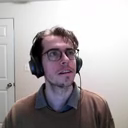

generated


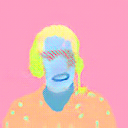

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame52.png']
process image... ['datasets/face2/test_seg/frame52.png']
label


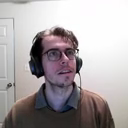

generated


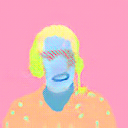

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame53.png']
process image... ['datasets/face2/test_seg/frame53.png']
label


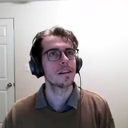

generated


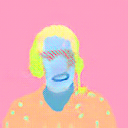

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame54.png']
process image... ['datasets/face2/test_seg/frame54.png']
label


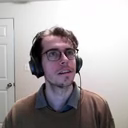

generated


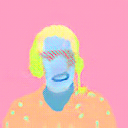

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame55.png']
process image... ['datasets/face2/test_seg/frame55.png']
label


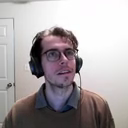

generated


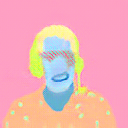

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame56.png']
process image... ['datasets/face2/test_seg/frame56.png']
label


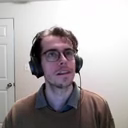

generated


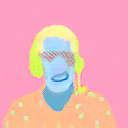

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame57.png']
process image... ['datasets/face2/test_seg/frame57.png']
label


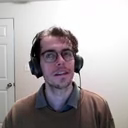

generated


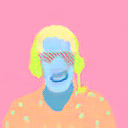

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame58.png']
process image... ['datasets/face2/test_seg/frame58.png']
label


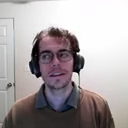

generated


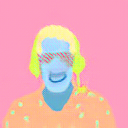

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame59.png']
process image... ['datasets/face2/test_seg/frame59.png']
label


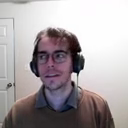

generated


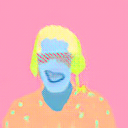

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame6.png']
process image... ['datasets/face2/test_seg/frame6.png']
label


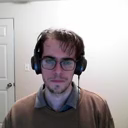

generated


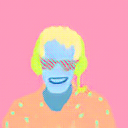

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame60.png']
process image... ['datasets/face2/test_seg/frame60.png']
label


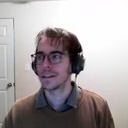

generated


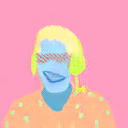

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame61.png']
process image... ['datasets/face2/test_seg/frame61.png']
label


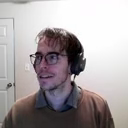

generated


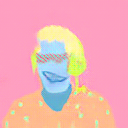

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame62.png']
process image... ['datasets/face2/test_seg/frame62.png']
label


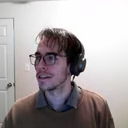

generated


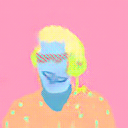

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame63.png']
process image... ['datasets/face2/test_seg/frame63.png']
label


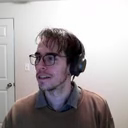

generated


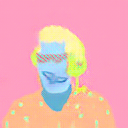

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame64.png']
process image... ['datasets/face2/test_seg/frame64.png']
label


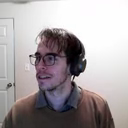

generated


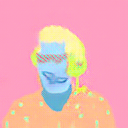

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame65.png']
process image... ['datasets/face2/test_seg/frame65.png']
label


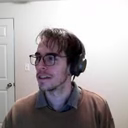

generated


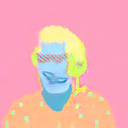

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame66.png']
process image... ['datasets/face2/test_seg/frame66.png']
label


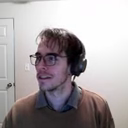

generated


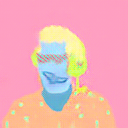

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame67.png']
process image... ['datasets/face2/test_seg/frame67.png']
label


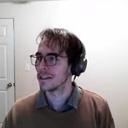

generated


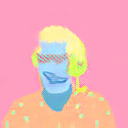

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame68.png']
process image... ['datasets/face2/test_seg/frame68.png']
label


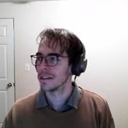

generated


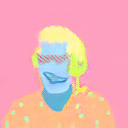

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame69.png']
process image... ['datasets/face2/test_seg/frame69.png']
label


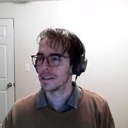

generated


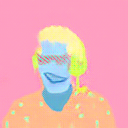

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame7.png']
process image... ['datasets/face2/test_seg/frame7.png']
label


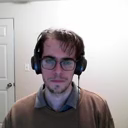

generated


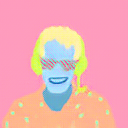

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame70.png']
process image... ['datasets/face2/test_seg/frame70.png']
label


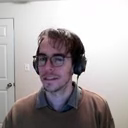

generated


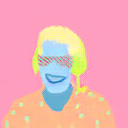

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame71.png']
process image... ['datasets/face2/test_seg/frame71.png']
label


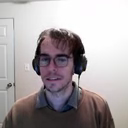

generated


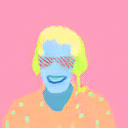

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame72.png']
process image... ['datasets/face2/test_seg/frame72.png']
label


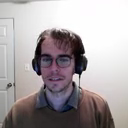

generated


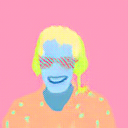

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame73.png']
process image... ['datasets/face2/test_seg/frame73.png']
label


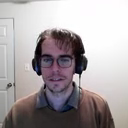

generated


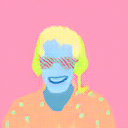

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame74.png']
process image... ['datasets/face2/test_seg/frame74.png']
label


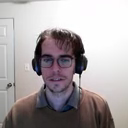

generated


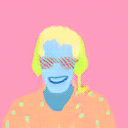

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame75.png']
process image... ['datasets/face2/test_seg/frame75.png']
label


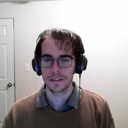

generated


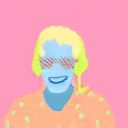

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame76.png']
process image... ['datasets/face2/test_seg/frame76.png']
label


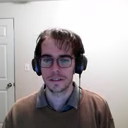

generated


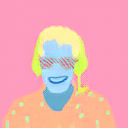

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame77.png']
process image... ['datasets/face2/test_seg/frame77.png']
label


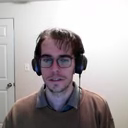

generated


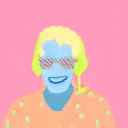

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame78.png']
process image... ['datasets/face2/test_seg/frame78.png']
label


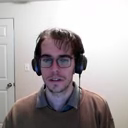

generated


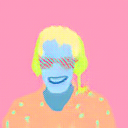

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame79.png']
process image... ['datasets/face2/test_seg/frame79.png']
label


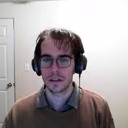

generated


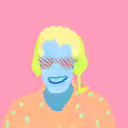

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame8.png']
process image... ['datasets/face2/test_seg/frame8.png']
label


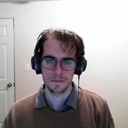

generated


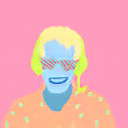

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame80.png']
process image... ['datasets/face2/test_seg/frame80.png']
label


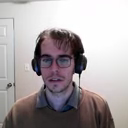

generated


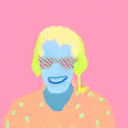

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame81.png']
process image... ['datasets/face2/test_seg/frame81.png']
label


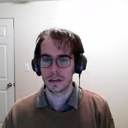

generated


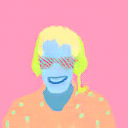

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame82.png']
process image... ['datasets/face2/test_seg/frame82.png']
label


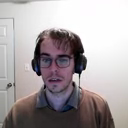

generated


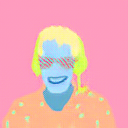

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame83.png']
process image... ['datasets/face2/test_seg/frame83.png']
label


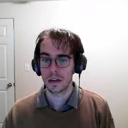

generated


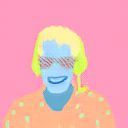

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame84.png']
process image... ['datasets/face2/test_seg/frame84.png']
label


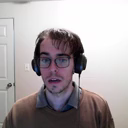

generated


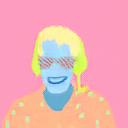

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame85.png']
process image... ['datasets/face2/test_seg/frame85.png']
label


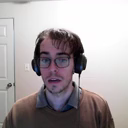

generated


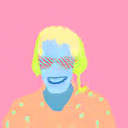

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame86.png']
process image... ['datasets/face2/test_seg/frame86.png']
label


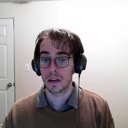

generated


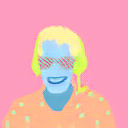

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame87.png']
process image... ['datasets/face2/test_seg/frame87.png']
label


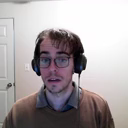

generated


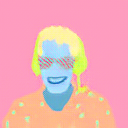

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame88.png']
process image... ['datasets/face2/test_seg/frame88.png']
label


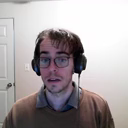

generated


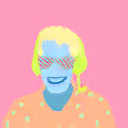

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame89.png']
process image... ['datasets/face2/test_seg/frame89.png']
label


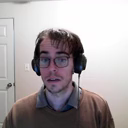

generated


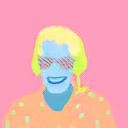

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame9.png']
process image... ['datasets/face2/test_seg/frame9.png']
label


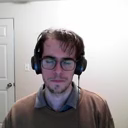

generated


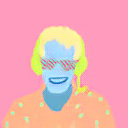

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame90.png']
process image... ['datasets/face2/test_seg/frame90.png']
label


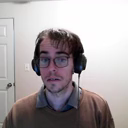

generated


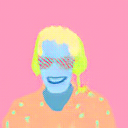

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame91.png']
process image... ['datasets/face2/test_seg/frame91.png']
label


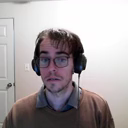

generated


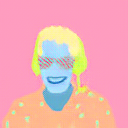

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame92.png']
process image... ['datasets/face2/test_seg/frame92.png']
label


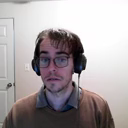

generated


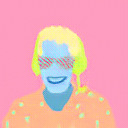

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame93.png']
process image... ['datasets/face2/test_seg/frame93.png']
label


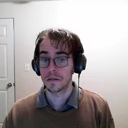

generated


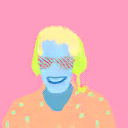

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame94.png']
process image... ['datasets/face2/test_seg/frame94.png']
label


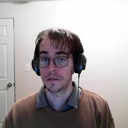

generated


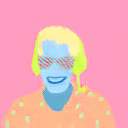

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame95.png']
process image... ['datasets/face2/test_seg/frame95.png']
label


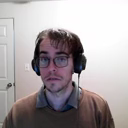

generated


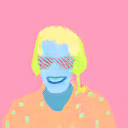

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame96.png']
process image... ['datasets/face2/test_seg/frame96.png']
label


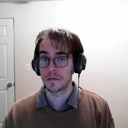

generated


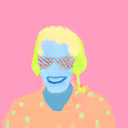

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame97.png']
process image... ['datasets/face2/test_seg/frame97.png']
label


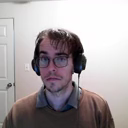

generated


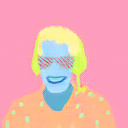

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame98.png']
process image... ['datasets/face2/test_seg/frame98.png']
label


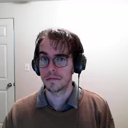

generated


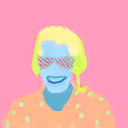

torch.Size([1, 3, 128, 128]) torch.Size([1]) torch.Size([1]) torch.Size([1, 3, 128, 128])
['datasets/face2/test_seg/frame99.png']
process image... ['datasets/face2/test_seg/frame99.png']
label


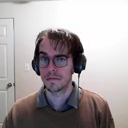

generated


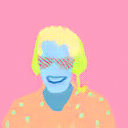

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [39]:
#@title Build Video Animation

#@markdown This cell will build your final video.
#@markdown Provide it with the filename of the video you want to build an animation from.
#@markdown <br>'video_fps' is the fps to sample the video you are animating _from_. The higher this value, the longer the generation time, but the higher the final quality.
#@markdown <br>'video_output_fps' is the fps of the animation video that will be _generated_. This is for compatibility with different video players.
video_filename    = "datasets/face2/final_video.mp4"  #@param{type:"string"}
video_fps         = 10                                #@param{type:"integer"}
video_output_fps  = 30                                #@param{type:"integer"}

#@markdown 'test_mode' will only generate a few frames, just to see what the results look like before doing a more expensive generation of all the frames:
test_mode         = True                              #@param{type:"boolean"}

assert video_fps > 0, f"fps must be positive. You set it to {video_fps}"
assert video_output_fps > 0, f"output fps must be positive. You set it to {video_output_fps}"

import os
input_dir = os.path.join(data_directory, "test_seg")
os.makedirs(input_dir, exist_ok=True)
output_dir = os.path.join(data_directory, "test_B")
os.makedirs(output_dir, exist_ok=True)
frame_name = os.path.join(input_dir, "frame%d.png")

# extract frames from the video.

%rm -r os.path.join(input_dir, '*.png'
%rm -r os.path.join(output_dir, '*.png')

if test_mode:
  video_fps = 1
  !ffmpeg -i '{video_filename}' -vf "fps='{video_fps}',select='between(t,0,3)'" '{frame_name}'
else:
  !ffmpeg -i '{video_filename}' -vf "fps='{video_fps}'" '{frame_name}'

# model inference on video frames.

import test
test.run({
    'name'                : output_name,
    'dataroot'            : data_directory,
    'primitive'           : 'seg',
    'no_instance'         : True,
    'which_epoch'         : 'latest',
    'save_to_drive'       : save_to_drive,

    # FIXED.
    'is_notebook'     : True,
    'phase'           : "test",
})

if not test_mode:
  
  # build animation video from generated frames.

  output_video_filename = os.path.join(output_dir, 'final_video.mp4')
  output_frame_name = os.path.join(output_dir, "frame%d.png")

  !ffmpeg -framerate '{video_fps}' -i '{output_frame_name}' -r 30 -pix_fmt yuv420p '{output_video_filename}' 